In [2]:
import os 
import numpy as np
import scipy as sci
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import scanpy as sc
import anndata as ann

from scipy.sparse import csr_matrix
from matplotlib import rcParams
from matplotlib import colors

import snapseed as snap
from snapseed.utils import read_yaml

sc.settings.verbosity = 3
sc.logging.print_versions()

-----
anndata     0.10.8
scanpy      1.10.1
-----
PIL                 9.4.0
asciitree           NA
asttokens           NA
astunparse          1.6.3
cffi                1.17.0
cloudpickle         3.0.0
colorama            0.4.6
comm                0.2.2
cycler              0.12.1
cython_runtime      NA
dask                2024.8.1
dateutil            2.9.0
debugpy             1.8.5
decorator           5.1.1
exceptiongroup      1.2.2
executing           2.0.1
google              NA
h5py                3.11.0
igraph              0.11.6
ipykernel           6.29.5
jedi                0.19.1
jinja2              3.1.4
joblib              1.4.2
kiwisolver          1.4.5
legacy_api_wrap     NA
leidenalg           0.10.2
llvmlite            0.43.0
markupsafe          2.1.3
matplotlib          3.9.2
mkl                 2.4.0
mpl_toolkits        NA
msgpack             1.0.8
natsort             8.4.0
numba               0.60.0
numcodecs           0.13.0
numpy               1.24.3
optree            

In [ ]:
sc.settings.set_figure_params(dpi=100)
sc.settings.verbosity = 3
sc.settings.n_jobs = 2
sc.set_figure_params(vector_friendly=True,color_map='viridis',dpi_save=600,transparent=True)

In [4]:
adata = sc.read_h5ad('/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/data/BRO_timecourse/BRO_RA1_exp023_dimreduc.h5ad')
adata

AnnData object with n_obs × n_vars = 55327 × 38606
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'percent.ribo', 'nCount_SCT', 'nFeature_SCT', 'singlets', 'Day', 'n_counts', 'log_counts', 'n_genes', 'mt_fraction', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'leiden', 'leiden_res_1', 'leiden_res_2', 'leiden_res_3', 'leiden_res_4'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'binomial_deviance', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'Day_colors', 'hvg', 'leiden', 'leiden_colors', 'leiden_res_1', 'leiden_res_1_colors', 'leiden_res_2', 'leiden_res_2_colors', 'leiden

## Compute cell cycle score

In [5]:
cc_genes = pd.read_csv('/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/assets/neftel_cellcycle_hm.tsv', delimiter='\t')
cc_genes

,G1/S,G2/M,G1/S_mouse,G2/M_mouse
0,RRM2,CCNB1,Rrm2,Cdc20
1,PCNA,CDC20,Pcna,Ccnb2
2,KIAA0101,CCNB2,Gmnn,Plk1
3,HIST1H4C,PLK1,Rnaseh2a,Ccna2
4,MLF1IP,CCNA2,Melk,Ckap2
5,GMNN,CKAP2,Cenpk,Knstrn
6,RNASEH2A,KNSTRN,Tk1,Racgap1
7,MELK,RACGAP1,Tmem106c,Cdca3
8,CENPK,CDCA3,Cdca5,Troap
9,TK1,TROAP,Cks1b,Kif2c


In [6]:
g1s = cc_genes['G1/S'].dropna()
g2m = cc_genes['G2/M'].dropna()

In [7]:
sc.tl.score_genes_cell_cycle(adata, g2m_genes=g2m, s_genes=g1s)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    261 total control genes are used. (0:00:03)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    231 total control genes are used. (0:00:03)
-->     'phase', cell cycle phase (adata.obs)


In [8]:
adata.obs['phase'].value_counts()

G1     27531
S      14511
G2M    13285
Name: phase, dtype: int64

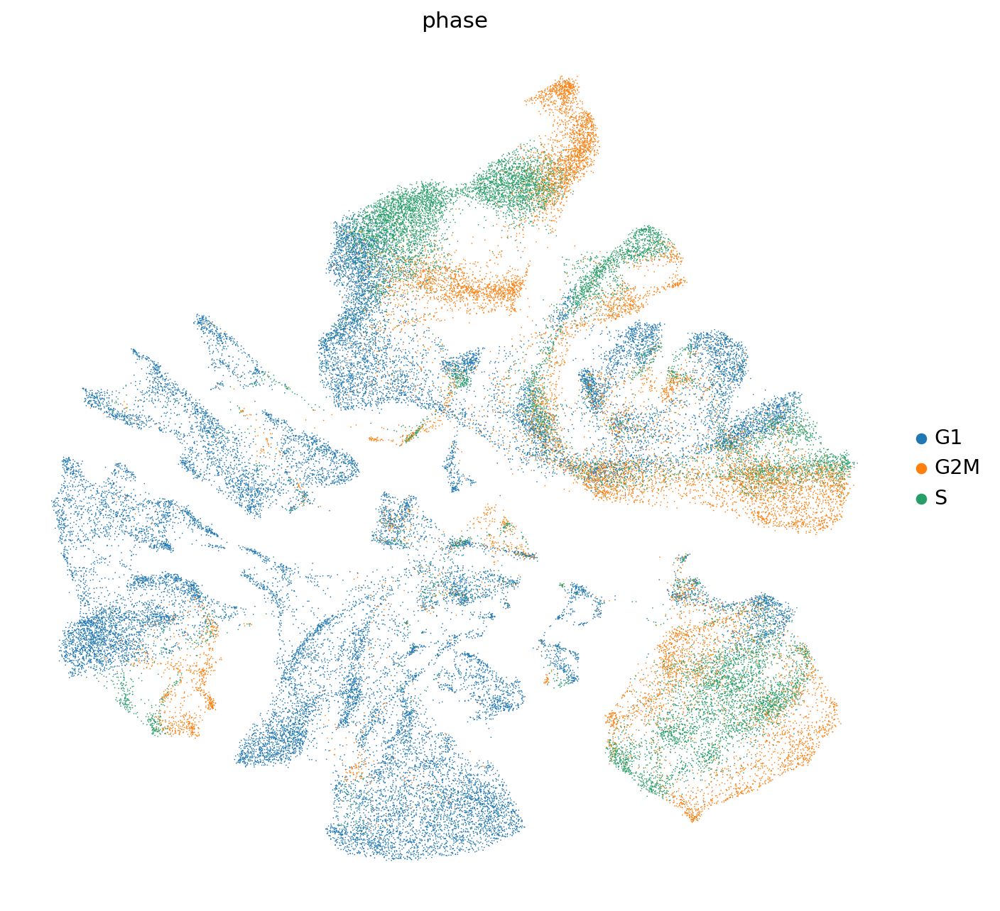

In [17]:
sc.pl.umap(adata, color='phase', frameon=False)

# Snapseed

In [9]:
# Read in the marker genes
marker_genes = read_yaml("/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/assets/snapseed/Data_S1_snapseed_markers.yaml")

In [10]:
marker_genes

{'neural_progenitor_cell': {'marker_genes': ['SOX2', 'VIM', 'NES'],
  'subtypes': {'glioblast': {'marker_genes': ['HOPX', 'BCAN', 'TNC']},
   'telencephalic_npc': {'marker_genes': ['FOXG1'],
    'subtypes': {'dorsal_npc': {'marker_genes': ['EMX1']},
     'hippocampal_npc': {'marker_genes': ['GABRA2', 'GABRB1']},
     'ventral_npc': {'marker_genes': ['DLX2']}}},
   'diencephalic_npc': {'marker_genes': ['TCF7L2', 'SIX3'],
    'subtypes': {'hypothalamic_npc': {'marker_genes': ['SIX3']},
     'thalamic_npc': {'marker_genes': ['TCF7L2']}}},
   'mesencephalic_npc': {'marker_genes': ['OTX2', 'PAX7']},
   'retinal_npc': {'marker_genes': ['VSX2']},
   'rhombencephalic_npc': {'marker_genes': ['CYP26A1',
     'HOXA2',
     'HOXB2',
     'UNC5C',
     'BCAN'],
    'subtypes': {'cerebellar_npc': {'marker_genes': ['UNC5C', 'CYP26A1']},
     'pons_npc': {'marker_genes': ['GPC6', 'BCAN']},
     'medullary_npc': {'marker_genes': ['HOXB2', 'HOXD3', 'HOXA3']}}}}},
 'neuron': {'marker_genes': ['STMN2', 'D

In [11]:
import jax.numpy as jnp
jnp.trapz = jnp.trapezoid ## Monkeypatch

In [11]:
snap_annot = snap.annotate_hierarchy(
    adata,
    marker_genes,
    "leiden_res_4",
    layer="logcounts",
    method="auroc",
    min_expr=0,
    expr_weight=1,
    auc_weight=1,
    marker_summary_fun="max",
)

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


In [12]:
pd.set_option('display.max_rows', None)

In [13]:
snap_annot['assignments']

,level_1,level_2,level_3,level_4,level_5
leiden_res_4,,,,,
0,neural_progenitor_cell,diencephalic_npc,thalamic_npc,NaN,NaN
1,neural_progenitor_cell,diencephalic_npc,thalamic_npc,NaN,NaN
10,neuron,excitatory_neuron,telencephalic_excitatory_neuron,deeper_layer_cortical_excitatory_neuron,NaN
11,astrocyte,NaN,NaN,NaN,NaN
12,neural_progenitor_cell,glioblast,NaN,NaN,NaN
13,astrocyte,NaN,NaN,NaN,NaN
14,neural_progenitor_cell,diencephalic_npc,thalamic_npc,NaN,NaN
15,neural_progenitor_cell,rhombencephalic_npc,pons_npc,NaN,NaN
16,neural_progenitor_cell,rhombencephalic_npc,pons_npc,NaN,NaN


In [17]:
adata.obs = adata.obs.join(snap_annot_diffmap["assignments"], on="leiden_diffmap_res_4")

In [18]:
adata.obs["level_2"] = adata.obs["level_2"].fillna(value=adata.obs["level_1"])
adata.obs["level_3"] = adata.obs["level_3"].fillna(value=adata.obs["level_2"])
adata.obs["level_4"] = adata.obs["level_4"].fillna(value=adata.obs["level_3"])
adata.obs["level_5"] = adata.obs["level_5"].fillna(value=adata.obs["level_4"])

In [19]:
adata.strings_to_categoricals()

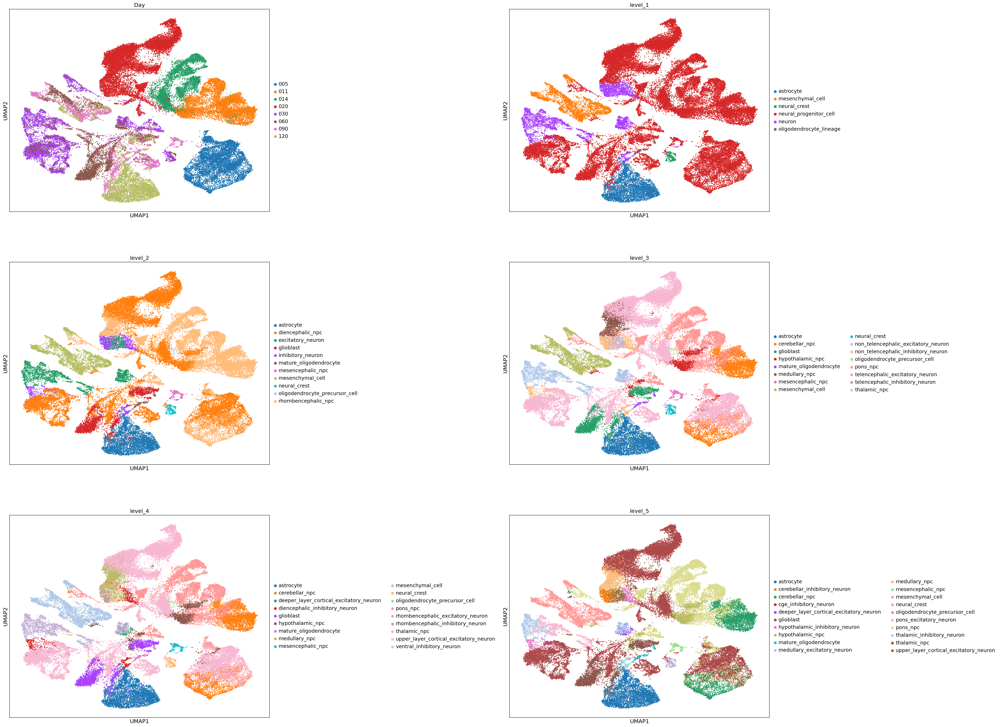

In [ ]:
rcParams["figure.figsize"]=(10,10)
sc.pl.umap(adata, color=["Day","level_1","level_2","level_3","level_4","level_5"], ncols=2, wspace=0.75, size=20)

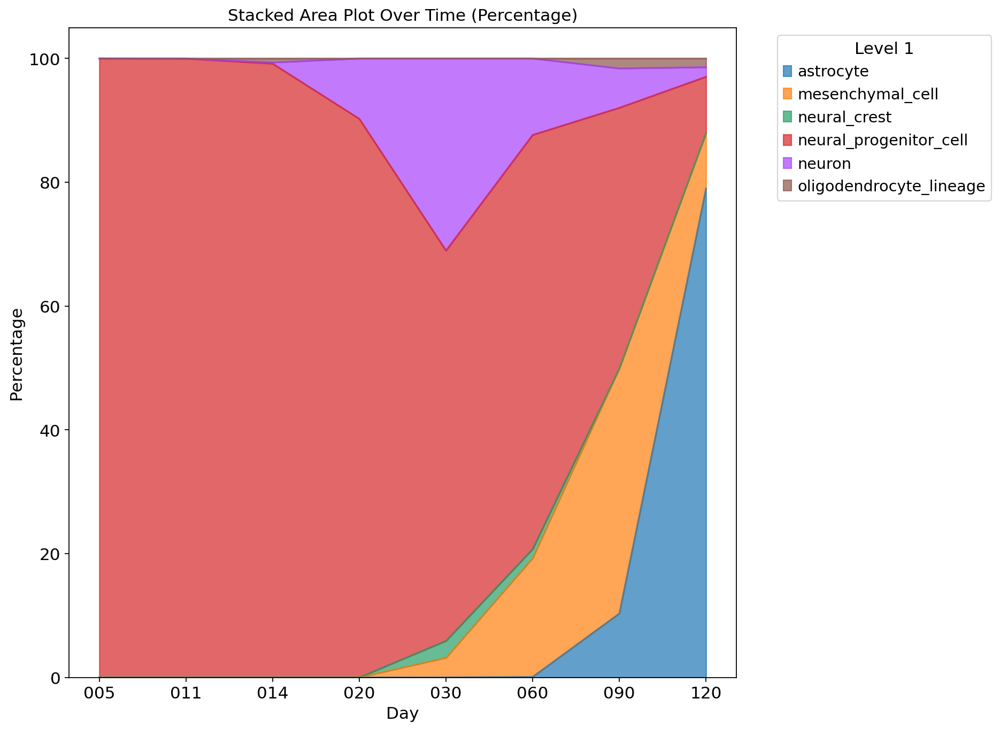

In [52]:
df = adata.obs[['Day','level_1']]
grouped = df.groupby(['Day', 'level_1']).size().unstack(fill_value=0)
grouped_percentage = grouped.div(grouped.sum(axis=1), axis=0) * 100
rcParams['figure.figsize']=(10,10)
grouped_percentage.plot(kind='area', stacked=True, alpha=0.7)
plt.title('Stacked Area Plot Over Time (Percentage)')
plt.xlabel('Day')
plt.ylabel('Percentage')
plt.legend(title='Level 1', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(False)
plt.show()

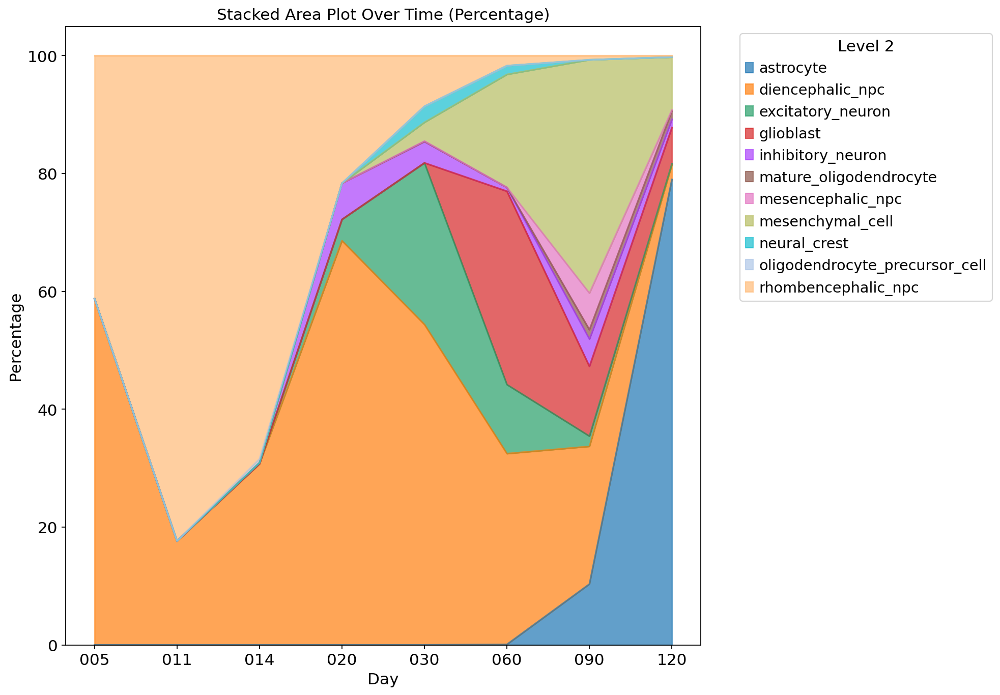

In [53]:
df = adata.obs[['Day','level_2']]
grouped = df.groupby(['Day', 'level_2']).size().unstack(fill_value=0)
grouped_percentage = grouped.div(grouped.sum(axis=1), axis=0) * 100
rcParams['figure.figsize']=(10,10)
grouped_percentage.plot(kind='area', stacked=True, alpha=0.7)
plt.title('Stacked Area Plot Over Time (Percentage)')
plt.xlabel('Day')
plt.ylabel('Percentage')
plt.legend(title='Level 2', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(False)
plt.show()

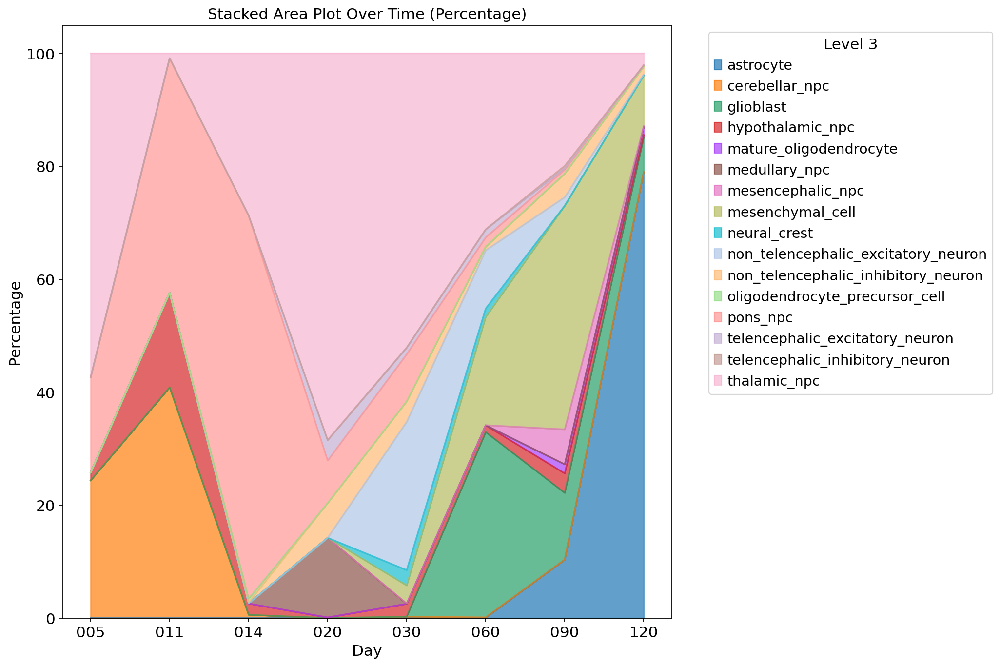

In [54]:
df = adata.obs[['Day','level_3']]
grouped = df.groupby(['Day', 'level_3']).size().unstack(fill_value=0)
grouped_percentage = grouped.div(grouped.sum(axis=1), axis=0) * 100
rcParams['figure.figsize']=(10,10)
grouped_percentage.plot(kind='area', stacked=True, alpha=0.7)
plt.title('Stacked Area Plot Over Time (Percentage)')
plt.xlabel('Day')
plt.ylabel('Percentage')
plt.legend(title='Level 3', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(False)
plt.show()

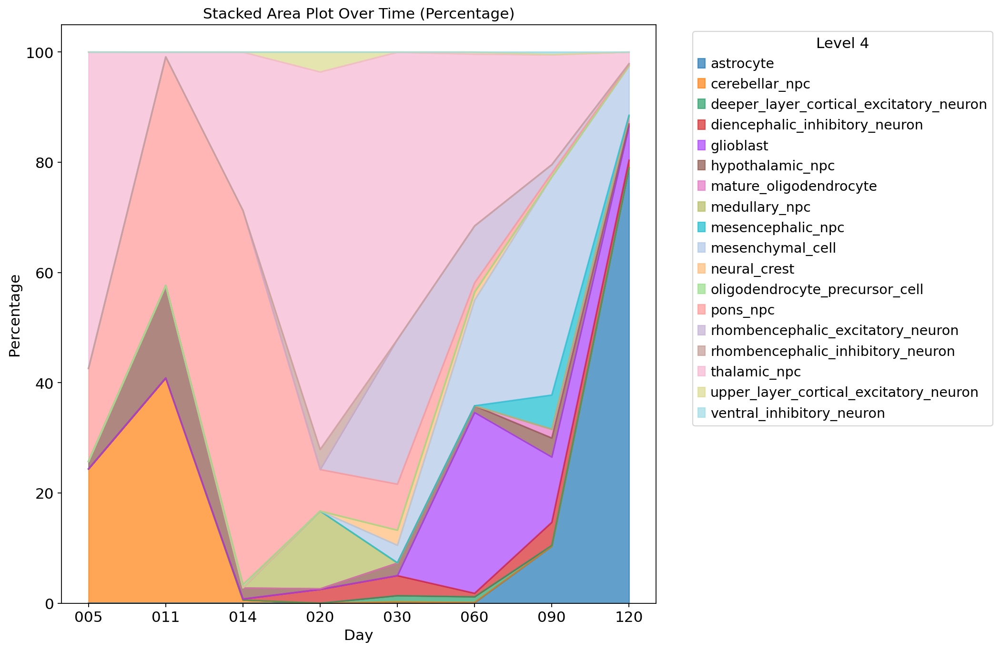

In [55]:
df = adata.obs[['Day','level_4']]
grouped = df.groupby(['Day', 'level_4']).size().unstack(fill_value=0)
grouped_percentage = grouped.div(grouped.sum(axis=1), axis=0) * 100
rcParams['figure.figsize']=(10,10)
grouped_percentage.plot(kind='area', stacked=True, alpha=0.7)
plt.title('Stacked Area Plot Over Time (Percentage)')
plt.xlabel('Day')
plt.ylabel('Percentage')
plt.legend(title='Level 4', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(False)
plt.show()

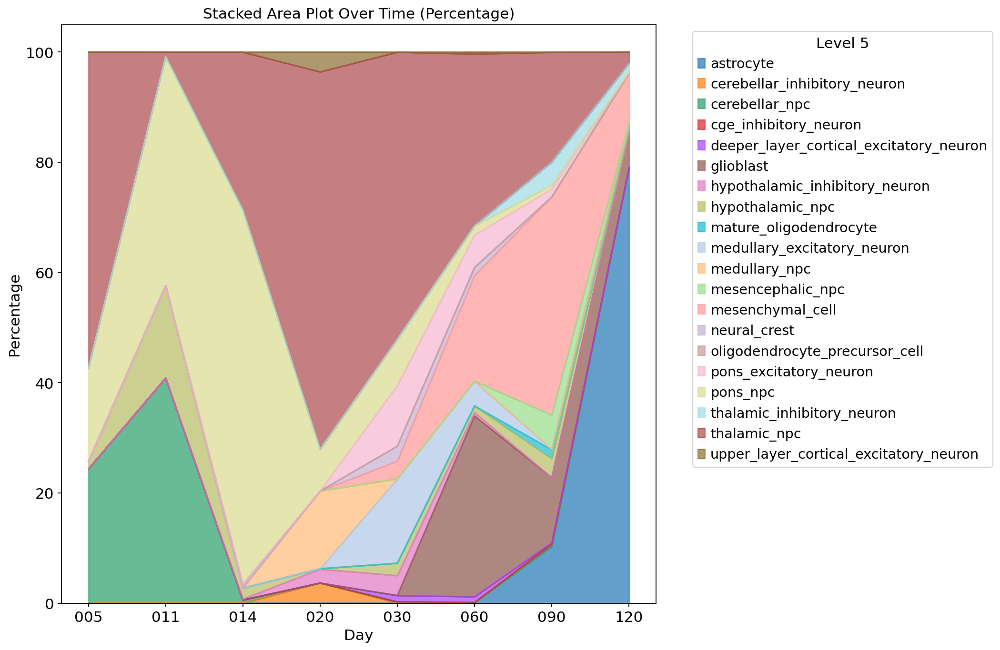

In [51]:
df = adata.obs[['Day','level_5']]
grouped = df.groupby(['Day', 'level_5']).size().unstack(fill_value=0)
grouped_percentage = grouped.div(grouped.sum(axis=1), axis=0) * 100
rcParams['figure.figsize']=(10,10)
grouped_percentage.plot(kind='area', stacked=True, alpha=0.7)
plt.title('Stacked Area Plot Over Time (Percentage)')
plt.xlabel('Day')
plt.ylabel('Percentage')
plt.legend(title='Level 5', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(False)
plt.show()

In [59]:
adata.write_h5ad('/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/data/BRO_timecourse/BRO_RA1_exp023_snapseed_annot.h5ad')